# Mapping Deprived Area

In [1]:
# import libraries

import sys
import numpy as np
import pandas as pd
from osgeo import gdal
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import os

import utils
import util_preprocess

## Set working directory

In [2]:
# Get abosolute path of the current folder
FPATH = '/media/owusu/Extreme SSD/IDEAMAPS/Training_Dataset/Accra'

# Get abosolute output path of te current folder
OUTPUT = '/media/owusu/Extreme SSD/IDEAMAPS/Training_Dataset/Accra/'

target = 'class'

# Random seed
random_seed = 42
# Set random seed in numpy
np.random.seed(random_seed)

## Load covariate features

In [3]:
PATH= f'/media/owusu/Extreme SSD/IDEAMAPS/covariate_feature_53bands/lag_covariate_compilation_53bands.tif'
img = utils.read_image(PATH)
img_arr=img[0]
img_gt=img[1]
img_georef=img[2]

# Process spfea features, get the width, height and number of bands
n = img_arr.shape[0]
print (n) # number of bands
h = img_arr.shape[1]
print (h) # height
w = img_arr.shape[2]
print (w) # width

53
685
1993


## Convert covariate array to pandas dataframe

In [4]:
bandname = ['fs_dist_fs_2020', 'fs_dist_school_2020', 'in_dist_rd_2016', 'in_dist_rd_intersect_2016', 'in_dist_waterway_2016', 'in_night_light_2016',
'ph_base_water_2010', 'ph_bio_dvst_2015', 'ph_climate_risk_2020', 'ph_dist_aq_veg_2015', 'ph_dist_art_surface_2015', 'ph_dist_bare_2015',
'ph_dist_cultivated_2015', 'ph_dist_herb_2015', 'ph_dist_inland_water_2018', 'ph_dist_open_coast_2020', 'ph_dist_shrub_2015', 'ph_dist_sparse_veg_2015',
'ph_dist_woody_tree_2015', 'ph_gdmhz_2005', 'ph_grd_water_2000', 'ph_hzd_index_2011', 'ph_land_c1_2019', 'ph_land_c2_2020', 'ph_max_tem_2019',
'ph_ndvi_2019', 'ph_pm25_2016', 'ph_slope_2000', 'ses_an_visits_2016', 'ses_child_stunted_2016', 'ses_dpt3_2016', 'ses_hf_delivery_2016',
'ses_impr_water_src_2016', 'ses_ITN_2016', 'ses_m_lit_2016', 'ses_measles_2016', 'ses_odef_2016', 'ses_pfpr_2016', 'ses_preg_2016',
'ses_unmet_need_2016', 'ses_w_lit_2016', 'sh_dist_mnr_pofw_2019', 'sh_dist_pofw_2019', 'sh_ethno_den_2020', 'uu_bld_count_2020',
'uu_bld_den_2020', 'ho_impr_housing_2015', 'fs_dist_hf_2019', 'po_hrsl_2018', 'po_wp_2020', 'ph_dist_riv_network_2007', 'uu_urb_bldg_2018', 'ses_dist_gov_office_2022']


# Make dataframe
df_data=utils.make_data_frame(img_arr, bandname)
df_data.head()

(53, 685, 1993)


,fs_dist_fs_2020,fs_dist_school_2020,in_dist_rd_2016,in_dist_rd_intersect_2016,in_dist_waterway_2016,in_night_light_2016,ph_base_water_2010,ph_bio_dvst_2015,ph_climate_risk_2020,ph_dist_aq_veg_2015,...,sh_ethno_den_2020,uu_bld_count_2020,uu_bld_den_2020,ho_impr_housing_2015,fs_dist_hf_2019,po_hrsl_2018,po_wp_2020,ph_dist_riv_network_2007,uu_urb_bldg_2018,ses_dist_gov_office_2022
0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.553364
1,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.553356
2,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.553349
3,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.553343
4,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0.553339


## Load training data

In [5]:
# PATH = f'{FPATH}/Tiles_merge.tif'
PATH = '/media/owusu/Extreme SSD/IDEAMAPS/Training_Dataset/Lagos/Lagos_updated_tiles/lagos_tiles/Lagos_tiles_raster.tif'
train_set = utils.read_image(PATH)
train_array=train_set[0]
train_array = train_array.astype(int)
train_gt=train_set[1]
train_georef=train_set[2]
print (train_array.shape)

# Check unique values
(unique, counts) = np.unique(train_array, return_counts=True)
frequencies = np.asarray((unique, counts)).T
frequencies

(685, 1993)


array([[      0,     973],
       [      1,     568],
       [      3, 1363664]])

In [6]:
train_col_name = ["class"]
tr_img_data = train_array.flatten()
df_train = pd.DataFrame(tr_img_data, columns=train_col_name)
df_train.head()
[df_train['class'].unique()]

[array([3, 0, 1])]

## Concatenate training and covariate features

In [7]:
# concat trainset and data
data_concat = pd.concat([df_train, df_data], axis=1)
print (data_concat.shape)


(1365205, 54)


In [8]:
[data_concat['class'].unique()]

[array([3, 0, 1])]

In [9]:
df_full = data_concat.loc[data_concat['class'] != 3]
print(df_full.shape)
df_full.head()
[df_full['class'].unique()]

(1541, 54)


[array([0, 1])]

## Drop unwanted columns

In [16]:
# df_full = df_full.drop(columns=['ph_gdmhz_2005', 'ph_grd_water_2000', 'ph_hzd_index_2011', 'ph_base_water_2010', 'ses_pfpr_2016', 'ph_land_c1_2019', 'ph_land_c2_2020'])
df_full = df_full[['class', 'po_wp_2020', 'po_hrsl_2018', 'uu_bld_den_2020', 'uu_bld_count_2020', 'ph_slope_2000', 'ph_pm25_2016', 'ph_ndvi_2019', 'ph_bio_dvst_2015', 'ph_max_tem_2019', 'in_night_light_2016']]

## Split into train, validation and test

In [17]:
from sklearn.model_selection import train_test_split

# Divide the training data into training (80%) and testing (20%)
df_train, df_test = train_test_split(df_full, train_size=0.8, random_state=random_seed)
# Reset the index
df_train, df_test = df_train.reset_index(drop=True), df_test.reset_index(drop=True)

# Divide the training data into training (80%) and validation (20%)
df_train, df_val = train_test_split(df_train, train_size=0.9, random_state=random_seed)
# Reset the index
df_train, df_val = df_train.reset_index(drop=True), df_val.reset_index(drop=True)

print('df_train', df_train.shape)
print('df_val', df_val.shape)
print('df_test', df_test.shape)

df_train (1108, 11)
df_val (124, 11)
df_test (309, 11)


## Handling missing data

In [18]:
# Handling missing data
# Combine df_train, df_val and df_test
df = pd.concat([df_train, df_val, df_test], sort=False)

# Call nan_checker on df
df_nan = util_preprocess.nan_checker(df)

# Print df_nan
df_nan

# Print the unique data type of variables with NaN
pd.DataFrame(df_nan['dtype'].unique(), columns=['dtype'])

# Get the variables with missing values, their proportion of missing values and data type
df_miss = df_nan[df_nan['dtype'] == 'float64'].reset_index(drop=True)

# Print df_miss
df_miss

,var,proportion,dtype
0,ph_slope_2000,0.349773,float64
1,po_hrsl_2018,0.181700,float64
2,po_wp_2020,0.133679,float64
3,ph_bio_dvst_2015,0.118754,float64
4,uu_bld_den_2020,0.104478,float64
5,uu_bld_count_2020,0.104478,float64


In [19]:
# Imputing missing values
from sklearn.impute import SimpleImputer

# If there are missing values
if len(df_miss['var']) > 0:
    # The SimpleImputer
    si = SimpleImputer(missing_values=np.nan, strategy='mean')

    # Impute the variables with missing values in df_train, df_val and df_test
    df_train[df_miss['var']] = si.fit_transform(df_train[df_miss['var']])
    df_val[df_miss['var']] = si.transform(df_val[df_miss['var']])
    df_test[df_miss['var']] = si.transform(df_test[df_miss['var']])

## Encoding data

In [20]:
# Combine df_train, df_val and df_test
df = pd.concat([df_train, df_val, df_test], sort=False)

# Print the unique data type of variables in df
pd.DataFrame(df.dtypes.unique(), columns=['dtype'])

# Call cat_var_checker on df
# See the implementation in pmlm_utilities.ipynb
df_cat = util_preprocess.cat_var_checker(df)

# Print the dataframe
df_cat

,var,nunique


In [21]:
df.head()

,class,po_wp_2020,po_hrsl_2018,uu_bld_den_2020,uu_bld_count_2020,ph_slope_2000,ph_pm25_2016,ph_ndvi_2019,ph_bio_dvst_2015,ph_max_tem_2019,in_night_light_2016
0,1,29.393164,34.299669,6121.830078,52.0,1.000000,19.339664,0.217668,0.262384,33.057473,8.932932
1,0,100.901039,80.439971,117.718880,1.0,1.000000,20.503325,0.661917,0.252773,33.024242,1.292318
2,0,47.102135,65.953562,824.028137,7.0,1.188267,16.836351,0.595238,0.237660,33.434526,0.793138
3,1,115.730324,138.501769,4709.231445,40.0,1.000000,20.188499,0.094618,0.262951,33.340532,13.318946
4,0,104.856369,16.970171,1294.970825,11.0,1.000000,20.293047,0.355580,0.260203,33.235942,6.479880


In [22]:
# Separating the training, validation and test data
# Separating the training data
df_train = df.iloc[:df_train.shape[0], :]

# Separating the validation data
df_val = df.iloc[df_train.shape[0]:df_train.shape[0] + df_val.shape[0], :]

# Separating the test data
df_test = df.iloc[df_train.shape[0] + df_val.shape[0]:, :]

In [23]:
# Get the feature matrix
X_train = df_train[np.setdiff1d(df_train.columns, [target])].values
X_val = df_val[np.setdiff1d(df_val.columns, [target])].values
X_test = df_test[np.setdiff1d(df_test.columns, [target])].values

# Get the target vector
y_train = df_train[target].values
y_val = df_val[target].values
y_test = df_test[target].values

## Hyperparameter

In [24]:
from catboost import CatBoostClassifier, Pool
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.model_selection import GridSearchCV

### XGBOOST

In [25]:
params = {
          'scale_pos_weight': [2.5, 1.5, 2],
          'min_child_weight':[21, 7, 15],
          # 'subsample': [0.3, 0.5, 0.7],
          'max_depth' : [25, 27, 21],
            'alpha' : [0.001, 0.1, 0.5]
         }
model = XGBClassifier(validate_parameters=True, random_state=random_seed)
grid_search = GridSearchCV(model, param_grid=params, cv = 10, verbose=10, n_jobs=-4)
grid_search.fit(X_train, y_train)

model = XGBClassifier(validate_parameters=True, random_state=random_seed)
grid_search = GridSearchCV(model, param_grid=params, cv = 10, verbose=10, n_jobs=-4)
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 81 candidates, totalling 810 fits
[CV 1/10; 1/81] START alpha=0.001, max_depth=25, min_child_weight=21, scale_pos_weight=2.5
[CV 1/10; 1/81] END alpha=0.001, max_depth=25, min_child_weight=21, scale_pos_weight=2.5;, score=0.820 total time=   0.1s
[CV 5/10; 2/81] START alpha=0.001, max_depth=25, min_child_weight=21, scale_pos_weight=1.5
[CV 5/10; 2/81] END alpha=0.001, max_depth=25, min_child_weight=21, scale_pos_weight=1.5;, score=0.820 total time=   0.1s
[CV 9/10; 2/81] START alpha=0.001, max_depth=25, min_child_weight=21, scale_pos_weight=1.5
[CV 9/10; 2/81] END alpha=0.001, max_depth=25, min_child_weight=21, scale_pos_weight=1.5;, score=0.836 total time=   0.1s
[CV 4/10; 4/81] START alpha=0.001, max_depth=25, min_child_weight=7, scale_pos_weight=2.5
[CV 4/10; 4/81] END alpha=0.001, max_depth=25, min_child_weight=7, scale_pos_weight=2.5;, score=0.847 total time=   0.1s
[CV 4/10; 5/81] START alpha=0.001, max_depth=25, min_child_weight=7, scale_pos_weight=1

GridSearchCV(cv=10,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=42, ...),
             n_jobs=-4,
             param_grid={'alpha': [0.001, 0.1, 0.5], 'max_depth': [25, 27, 21],
                         'min_child_weight': [21, 7, 15],
                         'scale_pos_weight': [2.5, 1.5, 2]},
             verbose=10)

In [26]:
print(grid_search.best_params_)
model = XGBClassifier(**grid_search.best_params_, validate_parameters=True, random_state=random_seed)
model.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_val, y_val)])

from catboost.utils import eval_metric
# import CatBoost

predictions = model.predict(X_test)

F1 = eval_metric(y_test, predictions, 'F1')
Precision = eval_metric(y_test, predictions, 'Precision')
Recall = eval_metric(y_test, predictions, 'Recall')
print("F1:", F1)
print("Recall:", Recall)
print("Precision:", Precision)

{'alpha': 0.001, 'max_depth': 25, 'min_child_weight': 7, 'scale_pos_weight': 1.5}
[0]	validation_0-logloss:0.54904	validation_1-logloss:0.57762
[1]	validation_0-logloss:0.46572	validation_1-logloss:0.51145
[2]	validation_0-logloss:0.40573	validation_1-logloss:0.47022
[3]	validation_0-logloss:0.36246	validation_1-logloss:0.44485
[4]	validation_0-logloss:0.32880	validation_1-logloss:0.41643
[5]	validation_0-logloss:0.30521	validation_1-logloss:0.40685
[6]	validation_0-logloss:0.28805	validation_1-logloss:0.40314
[7]	validation_0-logloss:0.27345	validation_1-logloss:0.40366
[8]	validation_0-logloss:0.25835	validation_1-logloss:0.39366
[9]	validation_0-logloss:0.24736	validation_1-logloss:0.39513
[10]	validation_0-logloss:0.23774	validation_1-logloss:0.39524
[11]	validation_0-logloss:0.22810	validation_1-logloss:0.39798
[12]	validation_0-logloss:0.21995	validation_1-logloss:0.39282
[13]	validation_0-logloss:0.21435	validation_1-logloss:0.39429
[14]	validation_0-logloss:0.20896	validation_1

In [61]:
params = {
          # 'scale_pos_weight': 1.5,
          'early_stopping_rounds': 50,
          'eval_metric':'error',
          'min_child_weight':7,
          # 'subsample': 0.8,
          'max_depth' : 5
         }

model = XGBClassifier(**params, validate_parameters=True, random_state=random_seed)
model.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_val, y_val)])

from catboost.utils import eval_metric
# import CatBoost

predictions = model.predict(X_test)

F1 = eval_metric(y_test, predictions, 'F1')
Precision = eval_metric(y_test, predictions, 'Precision')
Recall = eval_metric(y_test, predictions, 'Recall')
print("F1:", F1)
print("Recall:", Recall)
print("Precision:", Precision)

[0]	validation_0-error:0.15614	validation_1-error:0.23387
[1]	validation_0-error:0.14350	validation_1-error:0.20968
[2]	validation_0-error:0.13628	validation_1-error:0.17742
[3]	validation_0-error:0.12545	validation_1-error:0.16935
[4]	validation_0-error:0.12455	validation_1-error:0.16935
[5]	validation_0-error:0.11913	validation_1-error:0.16935
[6]	validation_0-error:0.12094	validation_1-error:0.17742
[7]	validation_0-error:0.11913	validation_1-error:0.16129
[8]	validation_0-error:0.11372	validation_1-error:0.16935
[9]	validation_0-error:0.11101	validation_1-error:0.17742
[10]	validation_0-error:0.10830	validation_1-error:0.16935
[11]	validation_0-error:0.10108	validation_1-error:0.17742
[12]	validation_0-error:0.09477	validation_1-error:0.17742
[13]	validation_0-error:0.09206	validation_1-error:0.17742
[14]	validation_0-error:0.09025	validation_1-error:0.16935
[15]	validation_0-error:0.08484	validation_1-error:0.17742
[16]	validation_0-error:0.08574	validation_1-error:0.17742
[17]	va

In [62]:
df_data['uid'] = np.arange(start=0,stop = len(df_data), dtype=int)
# df_data = df_data.drop(columns=['ph_gdmhz_2005', 'ph_grd_water_2000', 'ph_hzd_index_2011', 'ph_base_water_2010', 'ses_pfpr_2016', 'ph_land_c1_2019', 'ph_land_c2_2020'])
df_data = df_data[['po_wp_2020', 'po_hrsl_2018', 'uu_bld_den_2020', 'uu_bld_count_2020', 'ph_slope_2000', 'ph_pm25_2016', 'ph_ndvi_2019', 'ph_bio_dvst_2015', 'ph_max_tem_2019', 'in_night_light_2016', 'uid']]
print(df_data.shape)
df_data.head()

(1365205, 11)


,po_wp_2020,po_hrsl_2018,uu_bld_den_2020,uu_bld_count_2020,ph_slope_2000,ph_pm25_2016,ph_ndvi_2019,ph_bio_dvst_2015,ph_max_tem_2019,in_night_light_2016,uid
0,-9999.0,-9999.0,-9999.0,-9999.0,15.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,0
1,-9999.0,-9999.0,-9999.0,-9999.0,15.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,1
2,-9999.0,-9999.0,-9999.0,-9999.0,15.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,2
3,-9999.0,-9999.0,-9999.0,-9999.0,15.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,3
4,-9999.0,-9999.0,-9999.0,-9999.0,15.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,4


In [63]:
data_X1 = df_data.copy()
data_X = data_X1.loc[ data_X1['po_wp_2020'] != -9999 ]
data_X = data_X.copy()
# data_X = data_X.loc[ data_X['po_wp_2020'] != 0 ]
data_uid = data_X
data_x  = data_X.drop(columns=['uid'])

data_uid['catid'] = np.arange(start=0,stop = len(data_uid), dtype=int)

In [64]:
from sklearn.impute import SimpleImputer

# The SimpleImputer
si = SimpleImputer(missing_values=np.nan, strategy='mean')
data_x_tran = si.fit_transform(data_x)

from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
# # Standardize  data
data_x_scale = ss.fit_transform(data_x_tran)

In [65]:
# PREDICTION
pred_map = model.predict(data_x_scale)

In [66]:
# Convert narray to dataframe
col_name = ['pred']
predictions_image = pd.DataFrame(pred_map, columns=col_name)
predictions_image['catid'] = np.arange(start=0,stop = len(predictions_image), dtype=int) # add a uniques id to merge
print(predictions_image.shape)
predictions_image.head()

(655429, 2)


,pred,catid
0,0,0
1,0,1
2,0,2
3,0,3
4,0,4


In [67]:
predictions_image.pred.unique()

array([0])

In [46]:
# merge prediction to data_x (data with useful info)
map_data = predictions_image.merge(data_uid, how='inner', on='catid')
# map_data = pd.concat([predictions_image, data_x], axis=1 )
print (map_data.shape)
#
# set index for merging with big image data
map_data  = map_data.set_index('uid')
df1  = df_data.set_index('uid')

(655429, 13)


In [47]:
# merge to bg image data
predictions_image_merge = pd.merge(df1, map_data, how='outer', right_index=True, left_index=True)


predictions_image = predictions_image_merge['pred'].values

print(predictions_image.shape)

(1365205,)


In [48]:
(unique, counts) = np.unique(predictions_image, return_counts=True)
frequencies = np.asarray((unique, counts)).T
frequencies

array([[     0., 655429.],
       [    nan, 709776.]])

### Saving model

In [28]:
import datetime

MPATH = '/media/owusu/Extreme SSD/IDEAMAPS/outputs/lagos_models'
T = datetime.datetime.now()
time = T.strftime("%y%m%d%H%M%S")
filename = 'lag_xgboost_feature_11'
out_file = f"{MPATH}/{filename}_{time}"

model.save_model(out_file)

[12:47:09] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[0]	validation_0-error:0.12782	validation_1-error:0.12271
[1]	validation_0-error:0.12111	validation_1-error:0.12821
[2]	validation_0-error:0.11561	validation_1-error:0.12454
[3]	validation_0-error:0.10788	validation_1-error:0.11355
[4]	validation_0-error:0.10421	validation_1-error:0.11355
[5]	validation_0-error:0.10421	validation_1-error:0.11355
[6]	validation_0-error:0.10523	validation_1-error:0.11355
[7]	validation_0-error:0.10258	validation_1-error:0.11172
[8]	validation_0-error:0.10096	validation_1-error:0.10440
[9]	validation_0-error:0.09363	validation_1-error:0.10623
[10]	validation_0-error:0.08935	validation_1-error:0.09524
[11]	validation_0-error:0.08854	validation_1-error:0.09890
[12]	validation_0-error:0.08508	validation_1-error:0.10623
[13]	validation_0-error:0.08142	validation_1-error:0.10256
[14]	validation_0-error:0.07979	validation_1-error:0.10256
[15]	validation_0-error:0.07877	vali

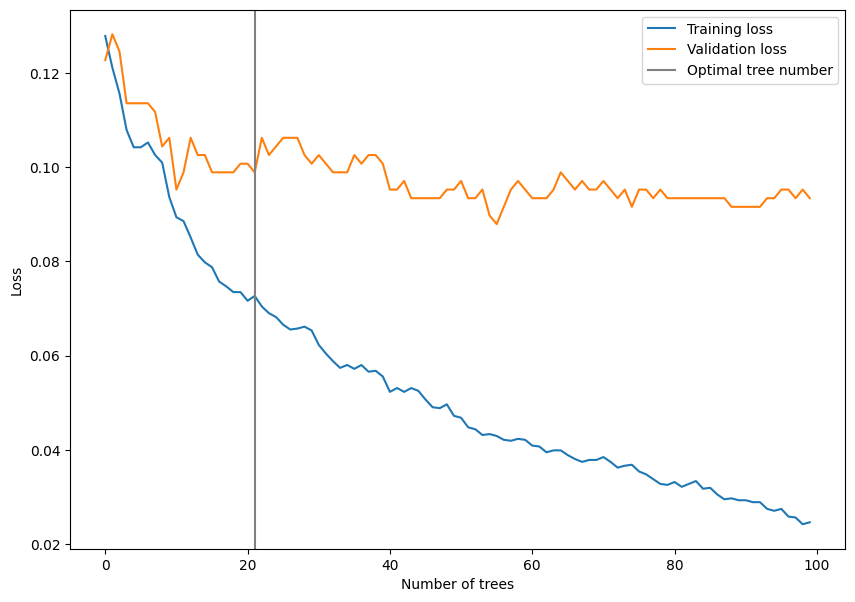

In [284]:
# params = {
#           # 'scale_pos_weight': 2.5,
#           'random_seed': random_seed,
#           'early_stopping_rounds': 50,
#           'eval_metric':'error',
#           'min_child_weight':7,
#           'subsample': 0.8,
#           'max_depth' : 5
#          }
#
# model = XGBClassifier(**params, validate_parameters=True, random_state=random_seed)
# model.fit(X_train, y_train,
#             eval_set=[(X_train, y_train), (X_val, y_val)])
#
# from catboost.utils import eval_metric
# # import CatBoost
#
# predictions = model.predict(X_test)
#
# F1 = eval_metric(y_test, predictions, 'F1')
# Precision = eval_metric(y_test, predictions, 'Precision')
# Recall = eval_metric(y_test, predictions, 'Recall')
# print("F1:", F1)
# print("Recall:", Recall)
# print("Precision:", Precision)
#
# from matplotlib import pyplot as plt
# results = model.evals_result()
#
# plt.figure(figsize=(10,7))
# plt.plot(results["validation_0"]["error"], label="Training loss")
# plt.plot(results["validation_1"]["error"], label="Validation loss")
# plt.axvline(21, color="gray", label="Optimal tree number")
# plt.xlabel("Number of trees")
# plt.ylabel("Loss")
# plt.legend()

### Catboost


In [287]:
params = {
          'iterations': [200,1000, 2000],
          'l2_leaf_reg': [5,7,9],
          'bootstrap_type': ['Bayesian'],
          # 'learning_rate': 0.1,
          'bagging_temperature': [0.1, 1.4, 3]
         }
model = CatBoostClassifier(random_state=random_seed)
grid_search = GridSearchCV(model, param_grid=params, cv = 10, verbose=10, n_jobs=-4)
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 27 candidates, totalling 270 fits
[CV 3/10; 2/27] START bagging_temperature=0.1, bootstrap_type=Bayesian, iterations=200, l2_leaf_reg=7
0:	learn: 0.6662392	total: 50.3ms	remaining: 10s
1:	learn: 0.6390639	total: 53.4ms	remaining: 5.29s
2:	learn: 0.6171860	total: 83.2ms	remaining: 5.46s
3:	learn: 0.5928027	total: 105ms	remaining: 5.15s
4:	learn: 0.5706260	total: 107ms	remaining: 4.17s
5:	learn: 0.5529412	total: 126ms	remaining: 4.09s
6:	learn: 0.5324249	total: 132ms	remaining: 3.63s
7:	learn: 0.5158258	total: 149ms	remaining: 3.57s
8:	learn: 0.5019196	total: 151ms	remaining: 3.21s
9:	learn: 0.4882302	total: 153ms	remaining: 2.91s
10:	learn: 0.4743260	total: 170ms	remaining: 2.92s
11:	learn: 0.4616898	total: 172ms	remaining: 2.69s
12:	learn: 0.4508367	total: 173ms	remaining: 2.49s
13:	learn: 0.4389321	total: 175ms	remaining: 2.33s
14:	learn: 0.4276427	total: 220ms	remaining: 2.71s
15:	learn: 0.4187981	total: 223ms	remaining: 2.57s
16:	learn: 0.4098114	total: 

GridSearchCV(cv=10,
             estimator=<catboost.core.CatBoostClassifier object at 0x7fc7cf584e50>,
             n_jobs=-4,
             param_grid={'bagging_temperature': [0.1, 1.4, 3],
                         'bootstrap_type': ['Bayesian'],
                         'iterations': [200, 1000, 2000],
                         'l2_leaf_reg': [5, 7, 9]},
             verbose=10)

In [289]:
model = CatBoostClassifier(**grid_search.best_params_, random_state=random_seed )

model.fit(X_train, y_train,
          eval_set=(X_val, y_val),
          use_best_model=True,
          plot=True,
         );

from catboost.utils import eval_metric
# import CatBoost

predictions = model.predict(X_test)

F1 = eval_metric(y_test, predictions, 'F1')
Precision = eval_metric(y_test, predictions, 'Precision')
Recall = eval_metric(y_test, predictions, 'Recall')
print("F1:", F1)
print("Recall:", Recall)
print("Precision:", Precision)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6654762	test: 0.6654115	best: 0.6654115 (0)	total: 2ms	remaining: 4s
1:	learn: 0.6384292	test: 0.6381474	best: 0.6381474 (1)	total: 4.36ms	remaining: 4.36s
2:	learn: 0.6163665	test: 0.6160470	best: 0.6160470 (2)	total: 6.48ms	remaining: 4.31s
3:	learn: 0.5945110	test: 0.5943156	best: 0.5943156 (3)	total: 8.41ms	remaining: 4.2s
4:	learn: 0.5724712	test: 0.5720463	best: 0.5720463 (4)	total: 10.5ms	remaining: 4.18s
5:	learn: 0.5543465	test: 0.5547202	best: 0.5547202 (5)	total: 12.5ms	remaining: 4.17s
6:	learn: 0.5348402	test: 0.5353954	best: 0.5353954 (6)	total: 14.6ms	remaining: 4.16s
7:	learn: 0.5184063	test: 0.5191352	best: 0.5191352 (7)	total: 16.8ms	remaining: 4.2s
8:	learn: 0.5019073	test: 0.5026836	best: 0.5026836 (8)	total: 18.9ms	remaining: 4.18s
9:	learn: 0.4887190	test: 0.4894197	best: 0.4894197 (9)	total: 20.9ms	remaining: 4.17s
10:	learn: 0.4746529	test: 0.4757408	best: 0.4757408 (10)	total: 26.9ms	remaining: 4.86s
11:	learn: 0.4619287	test: 0.4629873	best: 0.4629

### Saving model

In [290]:
import datetime

MPATH = '/media/owusu/Extreme SSD/IDEAMAPS/outputs/accra_models'
T = datetime.datetime.now()
time = T.strftime("%y%m%d%H%M%S")
filename = 'catboost_subset_11'
out_file = f"{MPATH}/{filename}_{time}"

model.save_model(out_file)

In [228]:
# params = {'loss_function':'Logloss',
#           'eval_metric':'F1',
#           'early_stopping_rounds': 2000,
#           'iterations': 2000,
#           'verbose': 500,
#           'random_seed': random_seed,
#           'l2_leaf_reg': 5,
#           'bootstrap_type': 'Bayesian',
#           # 'learning_rate': 0.1,
#           'bagging_temperature': 1.4
#          }
# # model = CatBoostClassifier(**params, class_weights=[0.2, 0.8])
# model = CatBoostClassifier(**params, scale_pos_weight=1.5)
#
# model.fit(X_train, y_train,
#           eval_set=(X_val, y_val),
#           use_best_model=True,
#           plot=True,
#          );
#
# from catboost.utils import eval_metric
# # import CatBoost
#
# predictions = model.predict(X_test)
#
# F1 = eval_metric(y_test, predictions, 'F1')
# Precision = eval_metric(y_test, predictions, 'Precision')
# Recall = eval_metric(y_test, predictions, 'Recall')
# print("F1:", F1)
# print("Recall:", Recall)
# print("Precision:", Precision)

# from matplotlib import pyplot as plt
# results = model.evals_result()
#
# plt.figure(figsize=(10,7))
# plt.plot(results["validation_0"]["error"], label="Training loss")
# plt.plot(results["validation_1"]["error"], label="Validation loss")
# plt.axvline(21, color="gray", label="Optimal tree number")
# plt.xlabel("Number of trees")
# plt.ylabel("Loss")
# plt.legend()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7634373	test: 0.7465753	best: 0.7465753 (0)	total: 6.84ms	remaining: 13.7s
500:	learn: 0.9218975	test: 0.8645720	best: 0.8655098 (484)	total: 1.79s	remaining: 5.35s
1000:	learn: 0.9692528	test: 0.8646003	best: 0.8691892 (769)	total: 3.78s	remaining: 3.77s
1500:	learn: 0.9887069	test: 0.8646575	best: 0.8702290 (1445)	total: 5.82s	remaining: 1.93s
1999:	learn: 0.9958625	test: 0.8646575	best: 0.8702290 (1445)	total: 7.71s	remaining: 0us

bestTest = 0.8702290076
bestIteration = 1445

Shrink model to first 1446 iterations.
F1: [0.8524173027989823]
Recall: [0.8678756476683938]
Precision: [0.8375]
